## <b> The Global Terrorism Database (GTD) is an open-source database including information on terrorist attacks around the world from 1970 through 2017. The GTD includes systematic data on domestic as well as international terrorist incidents that have occurred during this time period and now includes more than 180,000 attacks. The database is maintained by researchers at the National Consortium for the Study of Terrorism and Responses to Terrorism (START), headquartered at the University of Maryland.</b>

# <b> Explore and analyze the data to discover key findings pertaining to terrorist activities. </b>

##**Exploratory Data Analysis on dataset Global Terrorism**

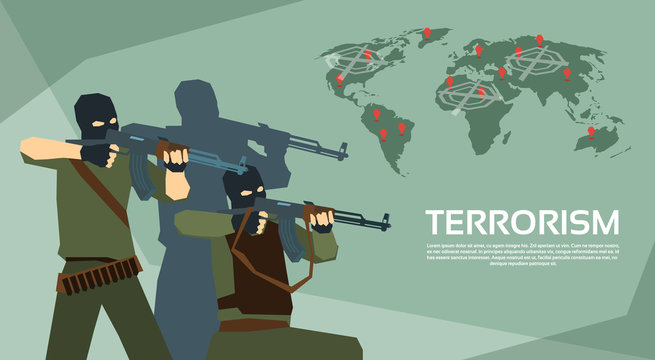

# **Objective**


---


Terrorism is a threat of violence that creates fear in a population. It is also important to understand that all violent acts are not terrorist acts.

As a security/defense analyst,find out the hot zone of terrorism and derive some security issues and insights by EDA.

# **TABLE OF CONTENTS:**

---


1. What this data set is all about?
2. Installation of libraries and dataset
3. Data preperation, Data Cleaning & Basic Analysis
4. Basic Analysis using visualization
5. Number of attacks every year
6. Attacks in various Countries and Regions
7. Most weapon used by terrorirsts 
8. Who are the main targets?
7. Types of targets attacked by the terror groups
8. Number of people killed in terror attack
10. Attacks vs Killed
11. Average No of People killed in an attack Regionwise
12. Most Notorious Groups
13. Activity of Top Terrorist Groups
14. Humanity Affected (World-wide) by Terrorist Attacks from 1970 to 2017
15. Analysis on India 

# **What this data set is all about?**


* >Consists Information on more than 180,000 Terrorist Attacks.

* >Includes information on terrorist attacks around the world from 1970 to 2017.

* >Includes systematic data on domestic as well as international terrorist incidents that have occurred during specific time period.

# **Installation of libraries and dataset**

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import warnings
warnings.filterwarnings('ignore')
import plotly.graph_objects as go
import plotly.express as px
import plotly.offline as py
import plotly.graph_objs as go
import matplotlib.pyplot as plt


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
path = "/content/drive/My Drive/Global Terrorism Analysis - Pratik Gumble/GlobalTerrorismData.csv"
df=pd.read_csv(path, encoding='ISO-8859-1')

In [ ]:
df.head()


,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


# **`Data preperation, Data Cleaning & Basic Analysis`**

In [ ]:
# NUmber of rows and columns in data set
print("Number of rows:",df.shape[0])
print("Number of columns:",df.shape[1])

Number of rows: 181691
Number of columns: 135


In [ ]:
df.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region',
       ...
       'addnotes', 'scite1', 'scite2', 'scite3', 'dbsource', 'INT_LOG',
       'INT_IDEO', 'INT_MISC', 'INT_ANY', 'related'],
      dtype='object', length=135)

In [ ]:
# Data type of each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 135 entries, eventid to related
dtypes: float64(55), int64(22), object(58)
memory usage: 187.1+ MB


In [ ]:
# Statistical analysis
df.describe()

,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
count,1.816910e+05,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,181685.000000,...,1.350000e+03,5.630000e+02,7.740000e+02,552.000000,10991.000000,10400.000000,181691.000000,181691.000000,181691.000000,181691.000000
mean,2.002705e+11,2002.638997,6.467277,15.505644,0.045346,131.968501,7.160938,23.498343,-4.586957e+02,1.451452,...,3.172530e+06,5.784865e+05,7.179437e+05,240.378623,4.629242,-29.018269,-4.543731,-4.464398,0.090010,-3.945952
std,1.325957e+09,13.259430,3.388303,8.814045,0.208063,112.414535,2.933408,18.569242,2.047790e+05,0.995430,...,3.021157e+07,7.077924e+06,1.014392e+07,2940.967293,2.035360,65.720119,4.543547,4.637152,0.568457,4.691325
min,1.970000e+11,1970.000000,0.000000,0.000000,0.000000,4.000000,1.000000,-53.154613,-8.618590e+07,1.000000,...,-9.900000e+01,-9.900000e+01,-9.900000e+01,-99.000000,1.000000,-99.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,1.991021e+11,1991.000000,4.000000,8.000000,0.000000,78.000000,5.000000,11.510046,4.545640e+00,1.000000,...,0.000000e+00,0.000000e+00,-9.900000e+01,0.000000,2.000000,-99.000000,-9.000000,-9.000000,0.000000,-9.000000
50%,2.009022e+11,2009.000000,6.000000,15.000000,0.000000,98.000000,6.000000,31.467463,4.324651e+01,1.000000,...,1.500000e+04,0.000000e+00,0.000000e+00,0.000000,4.000000,0.000000,-9.000000,-9.000000,0.000000,0.000000
75%,2.014081e+11,2014.000000,9.000000,23.000000,0.000000,160.000000,10.000000,34.685087,6.871033e+01,1.000000,...,4.000000e+05,0.000000e+00,1.273412e+03,0.000000,7.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,2.017123e+11,2017.000000,12.000000,31.000000,1.000000,1004.000000,12.000000,74.633553,1.793667e+02,5.000000,...,1.000000e+09,1.320000e+08,2.750000e+08,48000.000000,7.000000,2769.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
df.shape


(181691, 135)

In [ ]:
# Checking th null values
df.isnull().sum()

eventid            0
iyear              0
imonth             0
iday               0
approxdate    172452
               ...  
INT_LOG            0
INT_IDEO           0
INT_MISC           0
INT_ANY            0
related       156653
Length: 135, dtype: int64

In [ ]:
#Finding null values
Total_Number = df.isna().sum().sort_values(ascending = False)
Percentage =  ((df.isna().sum()/ df.isna().count())*100).sort_values(ascending=False)
Data_missing = pd.concat([Total_Number,Percentage],axis = 1, keys=['Total','Percentage'])
Data_missing.head(3)


,Total,Percentage
gsubname3,181671,99.988992
weapsubtype4_txt,181621,99.961473
weapsubtype4,181621,99.961473


Since most of the columns contain Null Values , selecting only those columns which will be useful in our Data exploration Journey

In [ ]:
#Selecting significant columns
# features = ['iyear','imonth','iday', 'extended','country_txt','region_txt','city',
#       'latitude','longitude','success','suicide', 'attacktype1_txt', 'targtype1_txt', 'target1','natlty1_txt', 'gname', 
#       'weaptype1_txt','nkill','motive']

# data = df[features]

In [ ]:
#Renaming the columns for better interpretability 
df.rename(columns={'iyear':'Year','imonth':'Month','iday':'Day','country_txt':'Country','region_txt':'Region',
                         'attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed','nwound':'Wounded','summary':'Summary',
                         'gname':'Group','targtype1_txt':'Target_type','weaptype1_txt':'Weapon_type','motive':'Motive'},inplace=True)
df.head(5)

,eventid,Year,Month,Day,approxdate,extended,resolution,country,Country,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


# **Variable Description**

* 'Year': Year of terrorist attacks,
* 'Month':Month of terrorist attacks
* 'Day':Date of month of terrorist attacks
* 'Country':Contry of terrorist attacks
* 'Region':Region of terrorist attacks
* 'State':State of terrorist attacks
* 'City': City of terrorist attacks
* 'Latitude':Latitude of terrorist attacks
* 'Longitude':Longitude of terrorist attacks
* 'Attack_Type':Type of terrorist attacks
* 'Summary':A brief statement or account of the main points of terrorist attacks.
* 'Target': A person, object, or place selected as the aim of an attack.
* 'Weapon_type':Weapon used in terrorist attacks
* 'Kills': Number of people killed in terrorist attacks
* 'Wound': Number of people wounded in terrorist attacks
* 'Motive': Motive of terrorist attacks
* 'Success': Sucess of terrorist attacks
* 'Group': terrorist Group Involved

In [ ]:
#Sorting Columns needed for the analysis form the dataframe
Terror=df[['Year','Month','Day','Country','Region','city','latitude','longitude','AttackType',
                   'Killed','Wounded','Target','Summary','Group','Target_type','Weapon_type','Motive','success']]

In [ ]:
# concatinating the columns killed and wounded
Terror["Killed"]=Terror["Killed"].fillna(0)
Terror["Wounded"]=Terror["Wounded"].fillna(0)
Terror["Casualty"]=Terror["Killed"]+Terror["Wounded"]
Terror.head(5)

,Year,Month,Day,Country,Region,city,latitude,longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type,Motive,success,Casualty
0,1970,7,2,Dominican Republic,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown,NaN,1,1.0
1,1970,0,0,Mexico,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown,NaN,1,0.0
2,1970,1,0,Philippines,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,Employee,NaN,Unknown,Journalists & Media,Unknown,NaN,1,1.0
3,1970,1,0,Greece,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,0.0,0.0,U.S. Embassy,NaN,Unknown,Government (Diplomatic),Explosives,NaN,1,0.0
4,1970,1,0,Japan,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,0.0,0.0,U.S. Consulate,NaN,Unknown,Government (Diplomatic),Incendiary,NaN,1,0.0


In [ ]:
#Checking for null values
Terror.isnull().sum()

Year                0
Month               0
Day                 0
Country             0
Region              0
city              434
latitude         4556
longitude        4557
AttackType          0
Killed              0
Wounded             0
Target            636
Summary         66129
Group               0
Target_type         0
Weapon_type         0
Motive         131130
success             0
Casualty            0
dtype: int64

In [ ]:
Terror.columns


Index(['Year', 'Month', 'Day', 'Country', 'Region', 'city', 'latitude',
       'longitude', 'AttackType', 'Killed', 'Wounded', 'Target', 'Summary',
       'Group', 'Target_type', 'Weapon_type', 'Motive', 'success', 'Casualty'],
      dtype='object')

Indentifying the null values present in the data set, so to process the null values.

In [ ]:
#missing data in the selected columns
total = Terror.isnull().sum().sort_values(ascending=False)
percent = round(((Terror.isnull().sum()/Terror.isnull().count())*100),2).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])

missing_data

,Total,Percent
Motive,131130,72.17
Summary,66129,36.40
longitude,4557,2.51
latitude,4556,2.51
Target,636,0.35
city,434,0.24
Year,0,0.00
success,0,0.00
Weapon_type,0,0.00
Target_type,0,0.00


In [ ]:
# Filling the null values 
Terror['city'].fillna('Unknown',inplace =True)

Terror['Target'].fillna('Unknown',inplace =True)

Terror['Killed'].fillna(0,inplace =True)

In [ ]:
Terror.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 19 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Year         181691 non-null  int64  
 1   Month        181691 non-null  int64  
 2   Day          181691 non-null  int64  
 3   Country      181691 non-null  object 
 4   Region       181691 non-null  object 
 5   city         181691 non-null  object 
 6   latitude     177135 non-null  float64
 7   longitude    177134 non-null  float64
 8   AttackType   181691 non-null  object 
 9   Killed       181691 non-null  float64
 10  Wounded      181691 non-null  float64
 11  Target       181691 non-null  object 
 12  Summary      115562 non-null  object 
 13  Group        181691 non-null  object 
 14  Target_type  181691 non-null  object 
 15  Weapon_type  181691 non-null  object 
 16  Motive       50561 non-null   object 
 17  success      181691 non-null  int64  
 18  Casualty     181691 non-

# **Basic Analysis by using visulisation**

In [ ]:
Terror['Year'].unique()

array([1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980,
       1981, 1986, 1982, 1983, 1984, 1985, 1987, 1988, 1989, 1990, 1991,
       1992, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003,
       2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014,
       2015, 2016, 2017])

As we can see from above, the Data for the Year 1993 is not present for some unknown reason

***Destructive Feature of data***

In [ ]:
print("Country with the most attacks:",Terror['Country'].value_counts().idxmax())
print("City with the most attacks:",Terror['city'].value_counts().index[1]) #as first entry is 'unknown'
print("Region with the most attacks:",Terror['Region'].value_counts().idxmax())
print("Year with the most attacks:",Terror['Year'].value_counts().idxmax())
print("Month with the most attacks:",Terror['Month'].value_counts().idxmax())
print("Group with the most attacks:",Terror['Group'].value_counts().index[1])
print("Most Attack Types:",Terror['AttackType'].value_counts().idxmax())

Country with the most attacks: Iraq
City with the most attacks: Baghdad
Region with the most attacks: Middle East & North Africa
Year with the most attacks: 2014
Month with the most attacks: 5
Group with the most attacks: Taliban
Most Attack Types: Bombing/Explosion


In [ ]:
# renaming labels from numerics to string for proper naming convention
Terror['success'] = Terror['success'].map({0:'Unsuccessful attempt', 1:'Successful attempt'} )

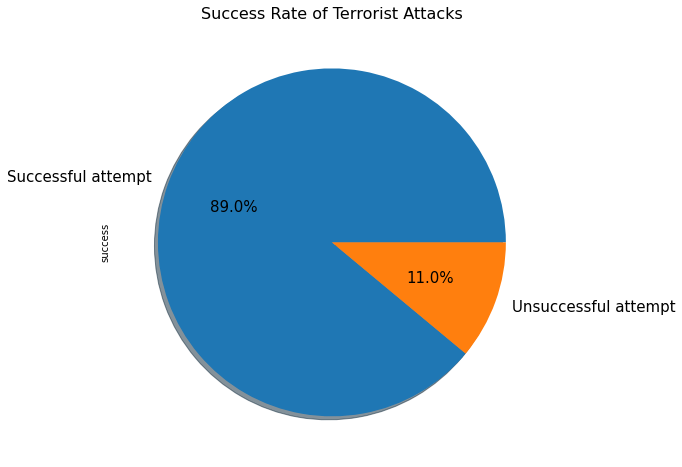

In [ ]:
# Plotting the success percentage of all the attacks happened 
plt.figure(figsize=(8,8))
Terror['success'].value_counts().plot(kind='pie',autopct='%1.1f%%',shadow=True, fontsize=15)
plt.title('Success Rate of Terrorist Attacks',fontsize = 16)
plt.show()

# Plotting the success percentage of all the attacks happened 
### The Success Rate of the terrorist attacks is 89%, which is a big issue of concern for the safety of citizens and organisations who are responsible for the safety of everyone.Let's explore more about these attacks...

## **Correlation plot :** 
#### This plot is used to investigate the dependence between multiple variables at the same time and to highlight the most correlated variables in a data table. In this visual, correlation coefficients are colored according to the value.

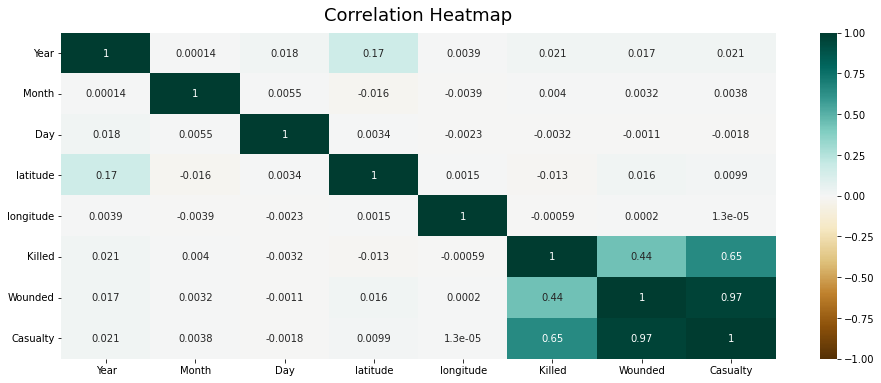

In [ ]:
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(Terror.corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);

From corelation plot we can infer about the high corelation betweeen some varaibles such as 
Killed and Casualty, wounded and Casualty are corelated to each other 

# **Let's start with the number of attacks in every year**

---



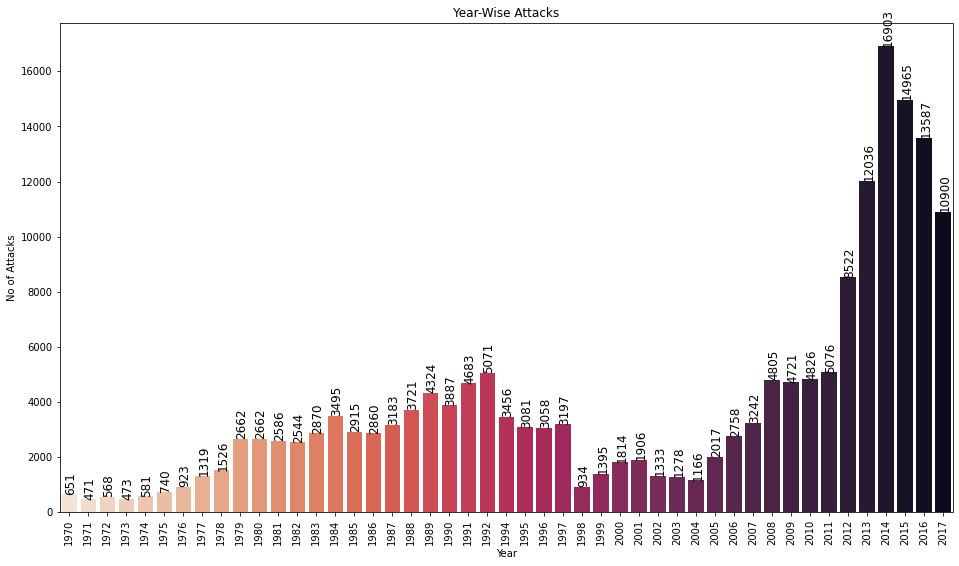

In [ ]:
plt.figure(figsize = (16,9))
ax = sns.countplot(Terror['Year'], palette = 'rocket_r')
plt.xticks(rotation = 90)
plt.ylabel("No of Attacks") 
plt.title("Year-Wise Attacks")

for p in ax.patches:
    ax.annotate('{}'.format(p.get_height()), (p.get_x()+0.15, p.get_height()+100), rotation = 90, size =12)

plt.show()

> # Here we can see that the abundance of terror attacks happened in the twenty-tens. This might indicate that number attacks increased as weapons got fairly advanced. The more damage the weapons cause, the more opportunity and reason the perpetrator sees. This can be called as a logical assumption for now.









# **Attacks in various Countries and Regions**



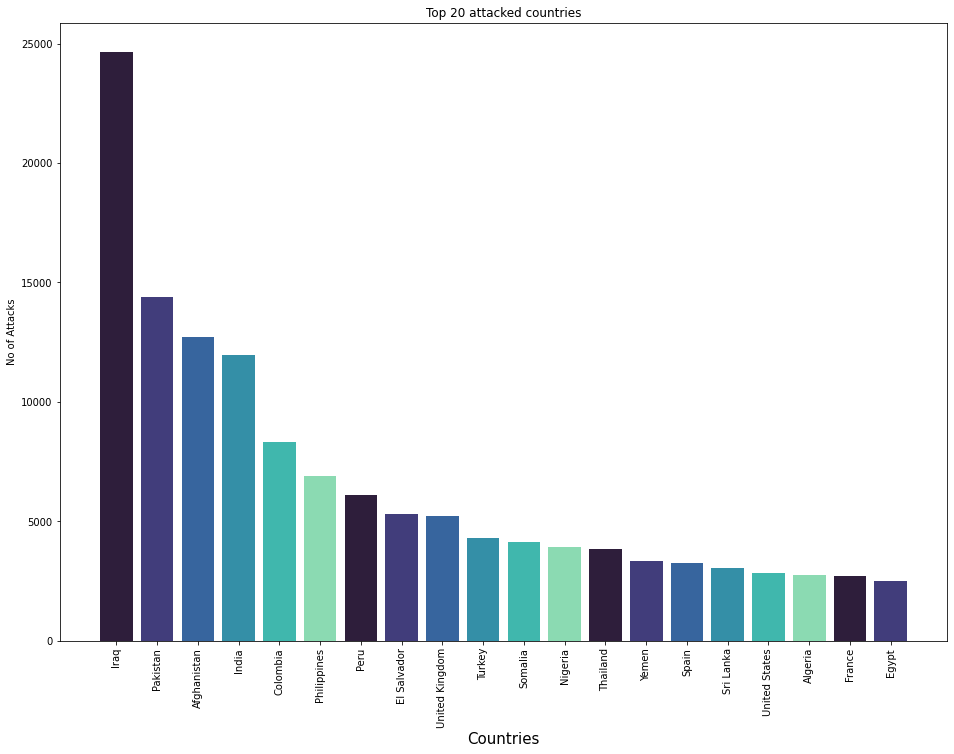

In [ ]:
fig = plt.figure(figsize = (35,25))
ax1 = fig.add_subplot(221)
ax1.bar(x = Terror['Country'].value_counts().index[:20], height = Terror['Country'].value_counts()[:20], color = sns.color_palette('mako'))
plt.xticks(rotation = 90)
plt.xlabel("Countries", fontsize = 15)
plt.ylabel("No of Attacks")
ax1.title.set_text('Top 20 attacked countries')

# Above bar plot shows the Top 20 attacked countries





# Hot zones of terrorism (by City)

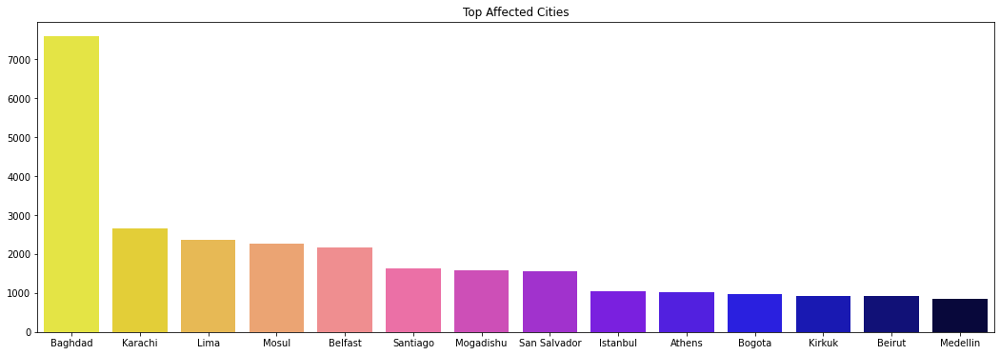

In [ ]:
plt.subplots(figsize=(18,6))
sns.barplot(Terror['city'].value_counts()[1:15].index,Terror['city'].value_counts()[1:15].values,palette='gnuplot2_r')
plt.title('Top Affected Cities')
plt.show()

#  Which region has highest terrorirst attacks? 

---






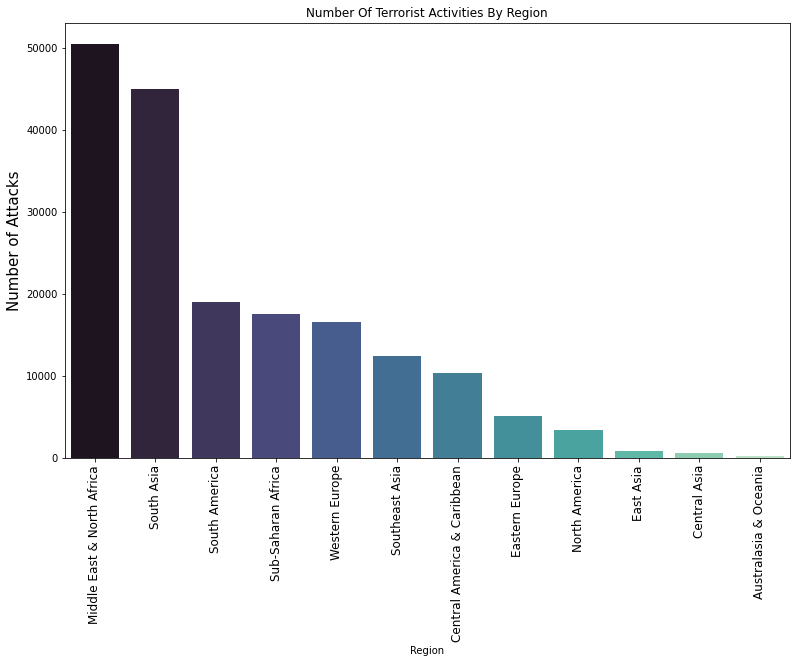

In [ ]:
# Plotting No of Attacks Region wise
plt.subplots(figsize=(13,8))
sns.countplot(x='Region',data=Terror,palette='mako',order=Terror['Region'].value_counts().index)
plt.xticks(rotation=90,fontsize = 12)
plt.ylabel('Number of Attacks', fontsize=15)
plt.title('Number Of Terrorist Activities By Region')
plt.show()

from above analysis Middle East & North Africa region followed by south Asia has largest terrorist acivities

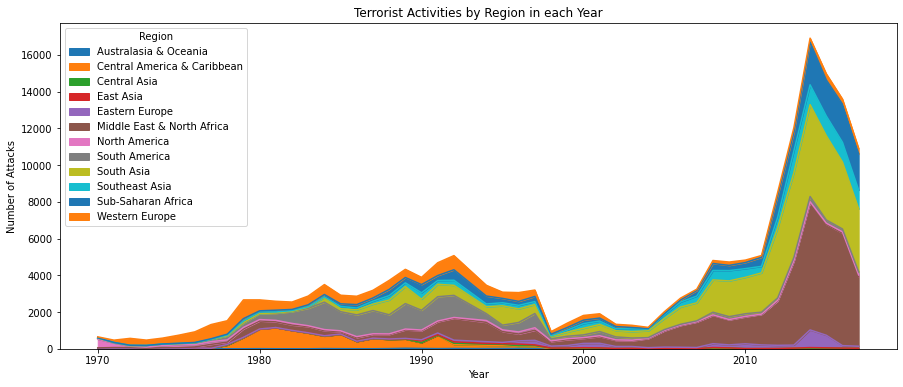

In [ ]:
pd.crosstab(Terror.Year, Terror.Region).plot(kind='area',figsize=(15,6))
plt.title('Terrorist Activities by Region in each Year')
plt.ylabel('Number of Attacks')
plt.show()

The above area graph help us to visualize region wise comaparison for Regions attacked across the years

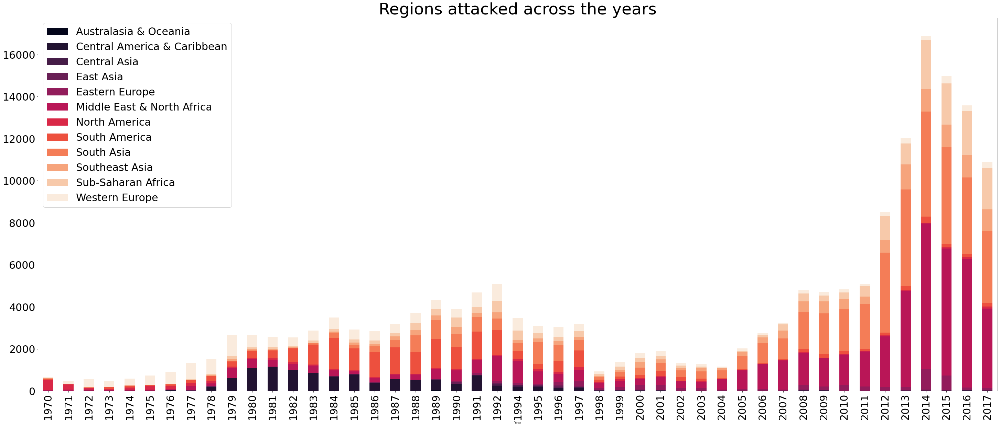

In [ ]:
df = Terror.groupby(['Region', 'Year']).size().reset_index().pivot(columns='Region', index='Year', values=0)
df.plot(kind = 'bar', stacked = True, figsize = (50,20), colormap = 'rocket')
plt.legend(loc=2, prop = {'size':30})
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
plt.title("Regions attacked across the years", fontsize = 47)
plt.show()

Values are sorted by the top 40 worst terror attacks as to keep the heatmap simple and easy to visualize

# **Which is the most weapon used by terrorirsts ?**

In [ ]:
Terror['Weapon_type'] = Terror['Weapon_type'].replace(['Vehicle (not to include vehicle-borne explosives, i.e., car or truck bombs)'],'Vehicles')
colors = ['lightslategray',] * 11
colors[0] = 'cyan'
x=Terror['Weapon_type'].value_counts().index
y=Terror['Weapon_type'].value_counts()
fig = go.Figure(data=[go.Bar(
    x=x.tolist(),
    y=y.tolist(),
    marker_color=colors,text=y,
            textposition='auto'  # marker color can be a single color value or an iterable
)])
fig.update_layout(title_text='Weapons used by terrorists', xaxis_title="Weapons",
    yaxis_title="Sum of occurences",)


From above graph Its clear that most used weapon type is Explosives in Terrorist attacks.

# **Who are the main targets?**

In [ ]:
colors = ['lightslategray',] * 22
colors[0] = 'cyan'
x=Terror['Target_type'].value_counts().index
y=Terror['Target_type'].value_counts()
fig = go.Figure(data=[go.Bar(
    x=x.tolist(),
    y=y.tolist(),
    marker_color=colors  # marker color can be a single color value or an iterable
)])
fig.update_layout(title_text='Main Targets', xaxis_title="Targets",
    yaxis_title="Sum of occurences",)

Military and Private Citizens seem to be the most common target for many active terror groups

# **Types of targets attacked by the terror groups**

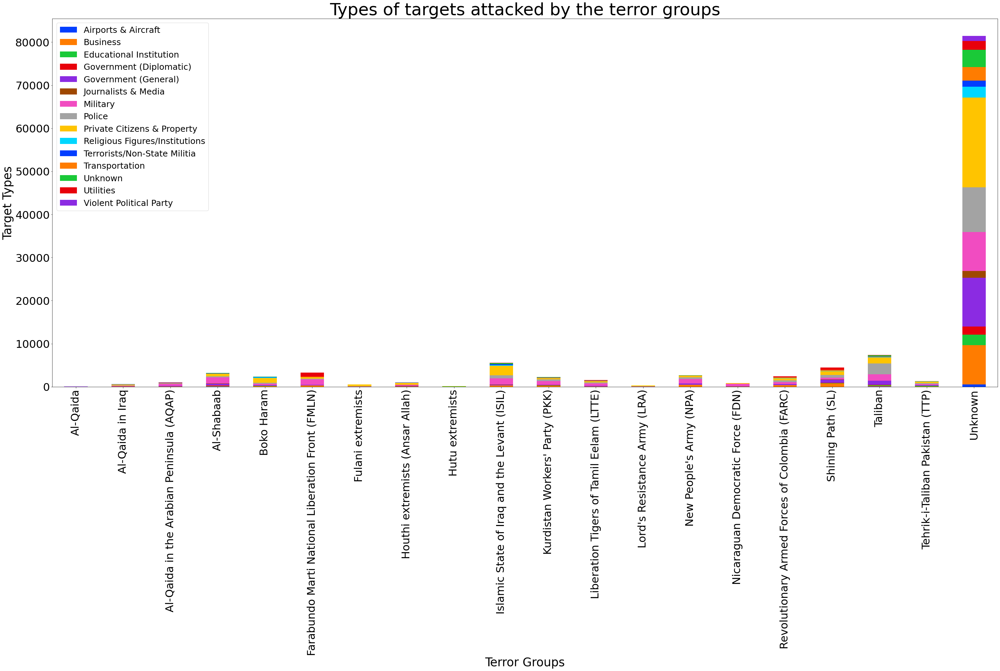

In [ ]:
top20 = Terror[['Group','Killed']].groupby(by = 'Group').sum().nlargest(20, 'Killed')
df4 = Terror[Terror['Group'].isin(list(top20.index))]
df4 = df4[df4['Target_type'].isin(list(Terror['Target_type'].value_counts().index[:15]))]
df4 = df4.groupby(['Target_type', 'Group']).size().reset_index().pivot(columns='Target_type', index='Group', values=0)
df4.plot(kind = 'bar', stacked = True, figsize = (50,20),color= sns.color_palette('bright'))
plt.legend(loc=2, prop = {'size':25})
plt.xlabel("Terror Groups", fontsize = 35)
plt.xticks(fontsize = 32)
plt.yticks(fontsize = 32)
plt.ylabel("Target Types", fontsize = 35)
plt.title("Types of targets attacked by the terror groups", fontsize = 50)
plt.show()

targets attacked by the terror groups are mostly private citizens, property and millitary persons

# **Number of people killed in terror attack**

In [ ]:
# Total Number of people killed in terror attack
killData = Terror.loc[:,'Killed']
print('Number of people killed by terror attack:', int(sum(killData.dropna())))# drop the NaN values

Number of people killed by terror attack: 411868


In [ ]:
# Let's look at what types of attacks these deaths were made of.
attackData = Terror.loc[:,'AttackType']
# attackData
typeKillData = pd.concat([attackData, killData], axis=1)

In [ ]:
typeKillData.head()

,AttackType,Killed
0,Assassination,1.0
1,Hostage Taking (Kidnapping),0.0
2,Assassination,1.0
3,Bombing/Explosion,0.0
4,Facility/Infrastructure Attack,0.0


In [ ]:
typeKillFormatData = typeKillData.pivot_table(columns='AttackType', values='Killed', aggfunc='sum')
typeKillFormatData

AttackType,Armed Assault,Assassination,Bombing/Explosion,Facility/Infrastructure Attack,Hijacking,Hostage Taking (Barricade Incident),Hostage Taking (Kidnapping),Unarmed Assault,Unknown
Killed,160297.0,24920.0,157321.0,3642.0,3718.0,4478.0,24231.0,880.0,32381.0


In [ ]:
typeKillFormatData.info()


<class 'pandas.core.frame.DataFrame'>
Index: 1 entries, Killed to Killed
Data columns (total 9 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Armed Assault                        1 non-null      float64
 1   Assassination                        1 non-null      float64
 2   Bombing/Explosion                    1 non-null      float64
 3   Facility/Infrastructure Attack       1 non-null      float64
 4   Hijacking                            1 non-null      float64
 5   Hostage Taking (Barricade Incident)  1 non-null      float64
 6   Hostage Taking (Kidnapping)          1 non-null      float64
 7   Unarmed Assault                      1 non-null      float64
 8   Unknown                              1 non-null      float64
dtypes: float64(9)
memory usage: 80.0+ bytes


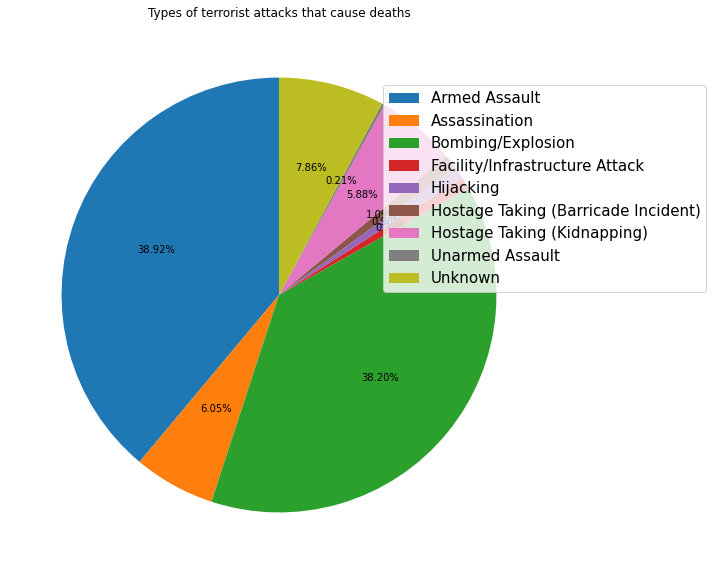

In [ ]:
labels = typeKillFormatData.columns.tolist() # convert line to list
transpoze = typeKillFormatData.T # transpoze
values = transpoze.values.tolist()
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(aspect="equal"))
plt.pie(values, startangle=90, autopct='%.2f%%')
plt.title('Types of terrorist attacks that cause deaths')
plt.legend(labels, loc='upper right', bbox_to_anchor = (1.3, 0.9), fontsize=15) # location legend
plt.show()

> # Armed assault and bombing/explosion are seen to be the cause of 77% of the deaths in these attacks. This rate is why these attacks are used so many times in terrorist actions. This is how dangerous weapons and explosives are to the world.

# **Attacks vs Killed**

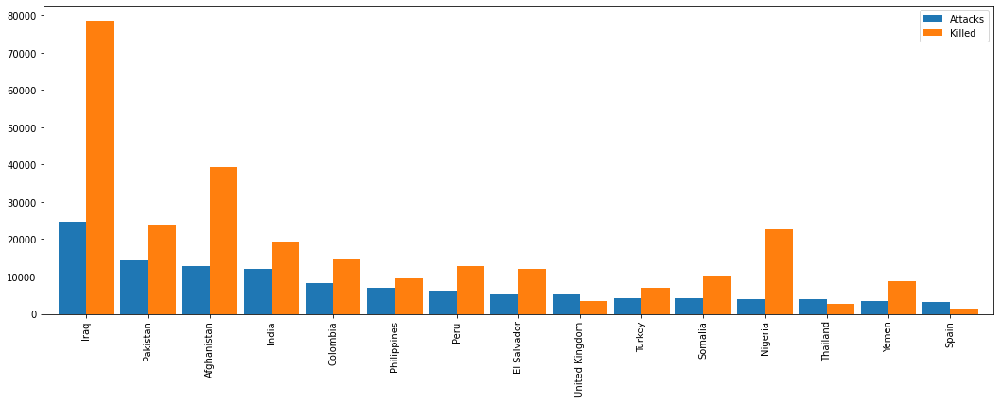

In [ ]:
coun_terror=Terror['Country'].value_counts()[:15].to_frame()
coun_terror.columns=['Attacks']
coun_kill=Terror.groupby('Country')['Killed'].sum().to_frame()
coun_terror.merge(coun_kill,left_index=True,right_index=True,how='left').plot.bar(width=0.9)
fig=plt.gcf()
fig.set_size_inches(18,6)
plt.show()

The People affected by these Terrorist attacks have been increased exponentially after year 2000

# **Year wise Casualties**

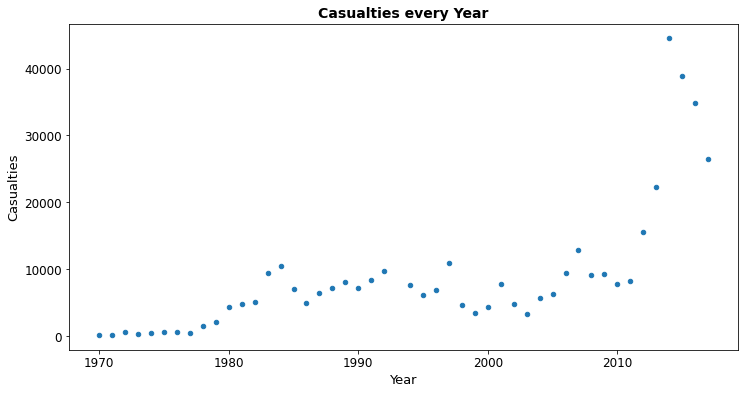

In [ ]:
# Plotting Casualties Yearwise(scatterplot)
df = Terror.groupby('Year')['Killed'].sum().reset_index()
df.plot.scatter(x ='Year', y='Killed', figsize=[12,6],fontsize=12)
plt.title('Casualties every Year', fontsize = 14, fontweight ='bold')
plt.xlabel('Year', fontsize = 13)
plt.ylabel('Casualties', fontsize = 13);

# **Average No of People killed in an attack Regionwise**

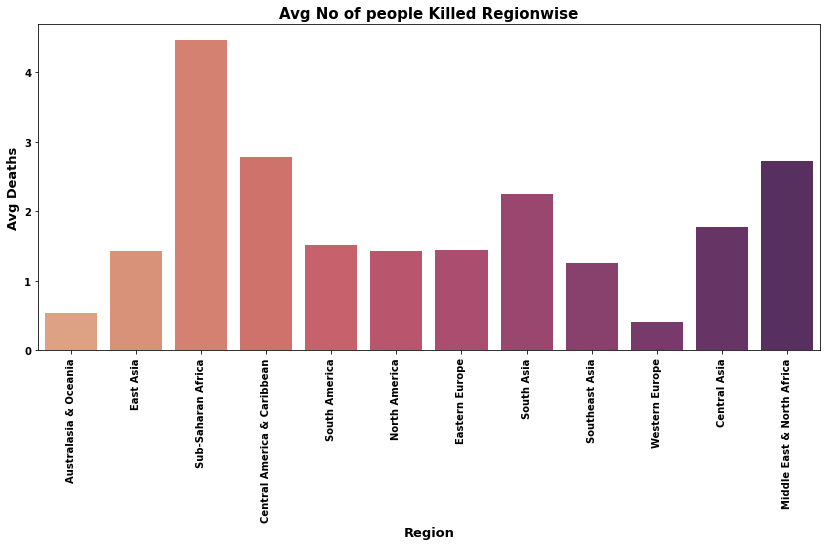

In [ ]:
# Average No of People killed in an attack Regionwise
regions = list(set(Terror['Region']))
region_mean_kills = []
for region in regions:
  region_mean_kills.append(Terror.Killed[Terror.Region == region].mean())

plt.subplots(figsize=(14,6))
sns.barplot(x= regions, y=region_mean_kills,palette ='flare')
plt.xlabel('Region', fontsize = 13, fontweight ='bold')
plt.ylabel('Avg Deaths', fontsize = 13, fontweight ='bold')
plt.title('Avg No of people Killed Regionwise', fontweight = 'bold', fontsize = 15)
plt.yticks(fontweight ='bold');
plt.xticks(rotation=90,fontweight ='bold');

# Most Average number of people from Sub-Saharan Africa are killed.

# **Most Notorious Groups**

In [ ]:
colors = ['lightslategray',] * 22
colors[13] = 'darkblue'
x=Terror['Group'].value_counts()[1:15].sort_values().values
y=Terror['Group'].value_counts()[1:15].sort_values().index
fig = go.Figure(data=[go.Bar(
    x=x.tolist(),
    y=y.tolist(),
    marker_color=colors,orientation='h'  # marker color can be a single color value or an iterable
)])
fig.update_layout(title_text='Main Targets', xaxis_title="Targets",
    yaxis_title="Sum of occurences",)

# **Activity of Top Terrorist Groups**

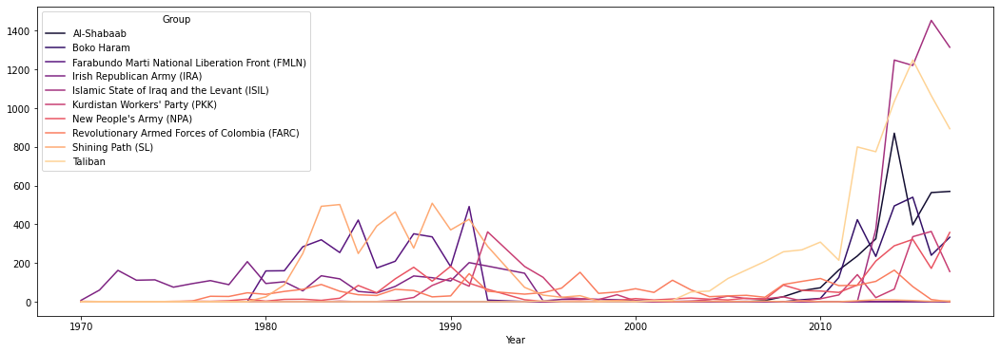

In [ ]:
top_groups10=Terror[Terror['Group'].isin(Terror['Group'].value_counts()[1:11].index)]
pd.crosstab(top_groups10.Year,top_groups10.Group).plot(color=sns.color_palette('magma',10))
fig=plt.gcf()
fig.set_size_inches(18,6)
plt.show()

# **Humanity Affected (World-wide) by Terrorist Attacks from 1970 to 2017**

In [ ]:
gk=Terror.groupby(by=["Year"], dropna=False,as_index=False).sum()
colors = ['lightslategray',] * 55
colors[43] = 'darkblue'
x=gk['Year']
y=gk['Casualty']
fig = go.Figure(data=[go.Bar(
    x=x.tolist(),
    y=y.tolist(),
    marker_color=colors  # marker color can be a single color value or an iterable
)])
fig.update_layout(title_text='Humanity Affected (World-wide) by Terrorist Attacks from 1970 to 2017', xaxis_title="Year",
    yaxis_title="Sum of occurences",)


It seems from above analysis 2010 onwards Trerrorsiam has affected the humanity in very destructive way

In [ ]:
casualty=Terror.loc[:,"Casualty"].sum()
print("Total number of Casualties due to Terrorist Attacks from 1970 to 2017 across the world :\n",casualty)

Total number of Casualties due to Terrorist Attacks from 1970 to 2017 across the world :
 935737.0


In [ ]:
import folium
from folium.plugins import MarkerCluster 
filterYear = Terror['Year'] == 2016

In [ ]:
filterData = Terror[filterYear] # filter data
# filterData.info()
reqFilterData = filterData.loc[:,'city':'longitude'] #We are getting the required fields
reqFilterData = reqFilterData.dropna() # drop NaN values in latitude and longitude
reqFilterDataList = reqFilterData.values.tolist()
# reqFilterDataList

In [ ]:
map = folium.Map(location = [0, 30], tiles='CartoDB positron', zoom_start=2)
# clustered marker
markerCluster = folium.plugins.MarkerCluster().add_to(map)
for point in range(0, len(reqFilterDataList)):
    folium.Marker(location=[reqFilterDataList[point][1],reqFilterDataList[point][2]],
                  popup = reqFilterDataList[point][0]).add_to(markerCluster)
map

84% of the terrorist attacks in 1970 were carried out on the American continent. In 1970, the Middle East and North Africa, currently the center of wars and terrorist attacks, faced only one terrorist attack.

Now let us check out which terrorist organizations have carried out their operations in each country. A value count would give us the terrorist organizations that have carried out the most attacks. we have indexed from 1 as to negate the value of 'Unknown'

In [ ]:
Terror.Group.value_counts()[1:15]

Taliban                                             7478
Islamic State of Iraq and the Levant (ISIL)         5613
Shining Path (SL)                                   4555
Farabundo Marti National Liberation Front (FMLN)    3351
Al-Shabaab                                          3288
New People's Army (NPA)                             2772
Irish Republican Army (IRA)                         2671
Revolutionary Armed Forces of Colombia (FARC)       2487
Boko Haram                                          2418
Kurdistan Workers' Party (PKK)                      2310
Basque Fatherland and Freedom (ETA)                 2024
Communist Party of India - Maoist (CPI-Maoist)      1878
Maoists                                             1630
Liberation Tigers of Tamil Eelam (LTTE)             1606
Name: Group, dtype: int64

In [ ]:
test = Terror[Terror.Group.isin(['Shining Path (SL)','Taliban','Islamic State of Iraq and the Levant (ISIL)'])]

In [ ]:
terror_df_group = Terror.dropna(subset=['latitude','longitude'])
terror_df_group = terror_df_group.drop_duplicates(subset=['Country','Group'])
terrorist_groups = Terror.Group.value_counts()[1:8].index.tolist()
terror_df_group = terror_df_group.loc[terror_df_group.Group.isin(terrorist_groups)]
print(terror_df_group.Group.unique())

["New People's Army (NPA)" 'Irish Republican Army (IRA)'
 'Shining Path (SL)' 'Farabundo Marti National Liberation Front (FMLN)'
 'Taliban' 'Al-Shabaab' 'Islamic State of Iraq and the Levant (ISIL)']


In [ ]:
map = folium.Map(location=[20, 0], tiles="CartoDB positron", zoom_start=2)
markerCluster = folium.plugins.MarkerCluster().add_to(map)
for i in range(0,len(terror_df_group)):
    folium.Marker([terror_df_group.iloc[i]['latitude'],terror_df_group.iloc[i]['longitude']], 
                  popup='Group:{}<br>Country:{}'.format(terror_df_group.iloc[i]['Group'], 
                  terror_df_group.iloc[i]['Country'])).add_to(map)

map

The Above map looks untidy even though it can be zoomed in to view the Country in question. Hence in the next chart, I have used Folium's Marker Cluster to cluster these icons. This makes it visually pleasing and highly interactive

In [ ]:
m1 = folium.Map(location=[20, 0], tiles="CartoDB positron", zoom_start=2)
marker_cluster = MarkerCluster(
    name='clustered icons',
    overlay=True,
    control=False,
    icon_create_function=None
)
for i in range(0,len(terror_df_group)):
    marker=folium.Marker([terror_df_group.iloc[i]['latitude'],terror_df_group.iloc[i]['longitude']]) 
    popup='Group:{}<br>Country:{}'.format(terror_df_group.iloc[i]['Group'],
                                          terror_df_group.iloc[i]['Country'])
    folium.Popup(popup).add_to(marker)
    marker_cluster.add_child(marker)
marker_cluster.add_to(m1)
folium.TileLayer('openstreetmap').add_to(m1)
# folium.TileLayer('Mapbox Bright').add_to(m1)
folium.TileLayer('cartodbdark_matter').add_to(m1)
folium.TileLayer('stamentoner').add_to(m1)
folium.LayerControl().add_to(m1)

m1

# **Analysis on Terrorisam in India :**

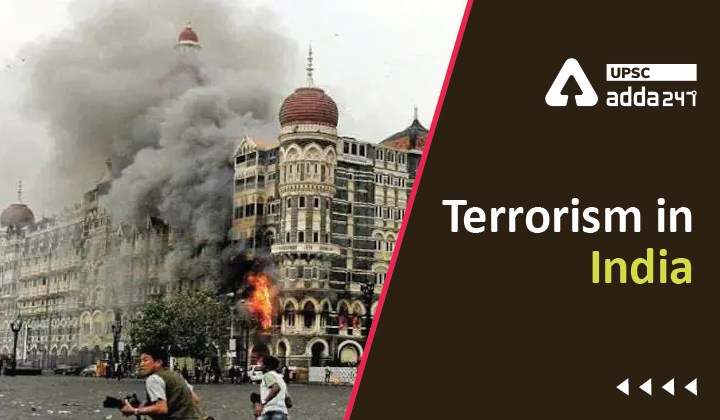

In [ ]:
terrordf_India= Terror[Terror['Country']=='India']
number_of_attacks_by_year =terrordf_India['Year'].value_counts().rename_axis('year').reset_index(name='number_of_attacks')
number_of_attacks_by_year.head()

,year,number_of_attacks
0,2016,1025
1,2017,966
2,2015,884
3,2014,860
4,2013,694


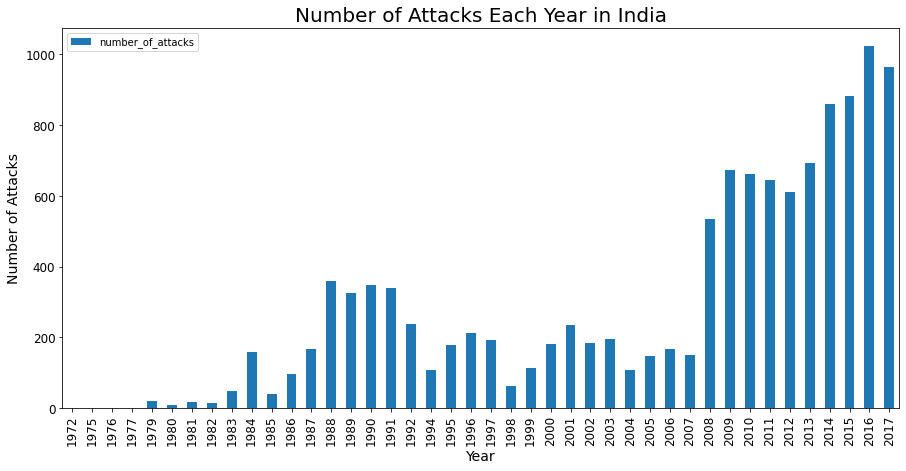

In [ ]:
# Plotting Nof of Attacks Yearwise
number_of_attacks_by_year.sort_values('year',ascending= True).plot(kind='bar',x='year',y='number_of_attacks', figsize = [15,7])
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Number of Attacks', fontsize=14)
plt.title('Number of Attacks Each Year in India', fontsize=20);

After Year 2007 the no of attacks are increased much in India

Year 2016 has the highest number of attack in India with total number of 1025 attacks in a year.

In [ ]:
# Cities with the most no of kills:
terrordf_India.groupby('city')['Killed'].sum().nlargest()[1:].reset_index()

,city,Killed
0,Srinagar,769.0
1,Mumbai,474.0
2,New Delhi,378.0
3,Amritsar,376.0


Top 4 Indian Cities with maximum number of people killed in Terrorist attacks are shown in the table below

Most Number of People were Killed In Year 1992.

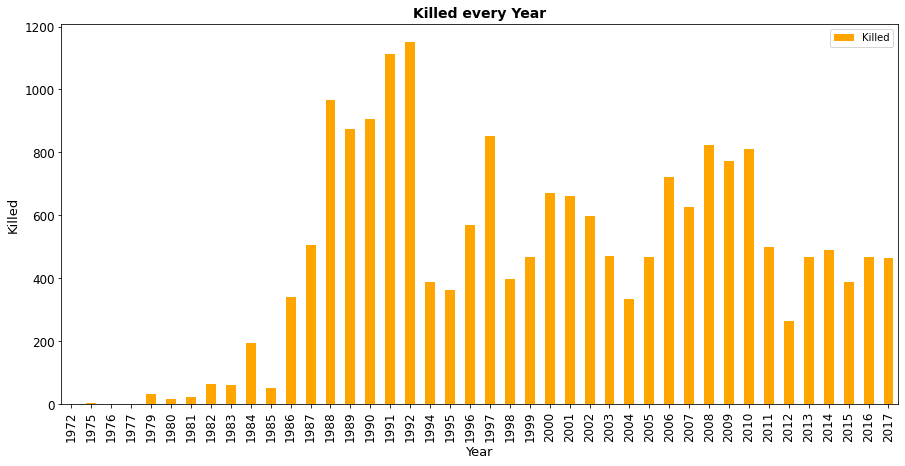

In [ ]:
df_India = terrordf_India.groupby('Year')['Killed'].sum().reset_index()
df_India.plot(kind = 'bar', x ='Year', y='Killed', figsize=[15,7],fontsize=12, color = 'orange')
plt.title('Killed every Year', fontsize = 14, fontweight ='bold')
plt.xlabel('Year', fontsize = 13)
plt.ylabel('Killed', fontsize = 13);

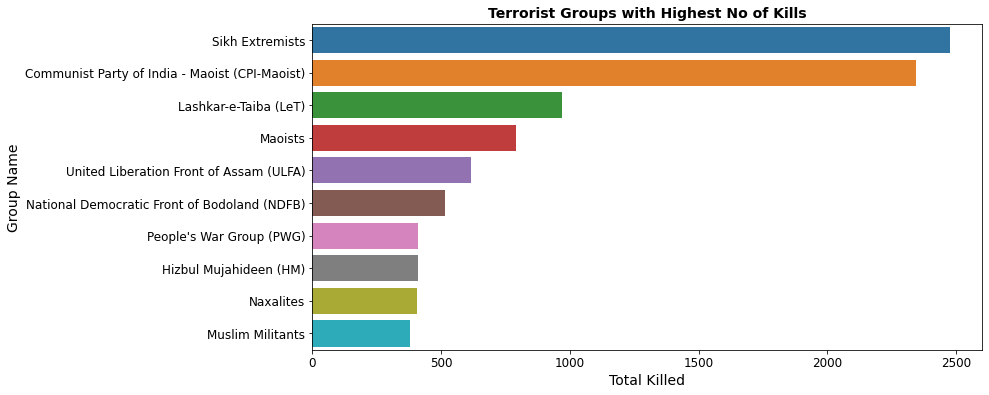

In [ ]:
# Most No of Kills by various Terrorist Groups in India
plt.subplots(figsize=(12,6))
terrordf_India = terrordf_India.drop(terrordf_India.loc[terrordf_India['Group']=='Unknown'].index)
Group_India = terrordf_India.groupby('Group')['Killed'].sum().nlargest(10)
sns.barplot(y = Group_India.index, x = Group_India.values)
plt.title('Terrorist Groups with Highest No of Kills', fontweight ='bold', fontsize = 14)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.xlabel('Total Killed',fontsize=14)
plt.ylabel('Group Name',fontsize=14);


# **Conclusion:**

> The dataset consist of many columns with Null Values, hence only those columns were taken into account which were useful and there null values were replaced with another suitable values.




> For some unknown reason the dataset doesn't provide any data for the Year 1993, also from this we can't conclude that no attack happened in this Year.

> After analysing the data using various functions and methods of Numpy and Pandas Libraries and Data Visualization techniques, variuos observation are made which are inferred below every visualization.

> From the above analysis we conclude that,Iraq country has highest number of attacks (24636) Middle and East Africa region has highest number of attacks (50474) Explosives are the most weapon used by terrorsits (92426). From the analysis we can see that on 2014 the number of terrorist activities were the highest in Iraq Country (16806) Private citizens and Property were the main targets in terrorism activity (43510) Bombing and Explosion methods were most commonly used in terrorism activity (82255). Taliban is most Notorious group with highest number of terrorist activitiies (7478) Strong security should be given for the countries Iraq,Pakistan,Afghanistan and India and also for middle East Regions and cities like Bhagdad,Karachi lima and many others.

> Terrorist activities are more in Middle East and North Africa Attacks have increased from 2010 in Middle East and South Africa Terrorist Organizations have started using Airports And Aircraft and Military as their major target type since 2000's Iraq has suffered the maximum number of terror attacks Andorra has suffered the minimum number of terror attacks Private citizens and Property are targeted widely by terrorist when compared to other people Total number of attacks from 1970 has increased drastically till 2017 South Asia, Australasia and Southeast asia have large number of terrorist activities Terrorist attacks in Middle East and North America have fatal consequences. Middle East and North Africa seen to have places of serious attacks. Muslims are attacked most by these attacks. Iraq, Afghanistan and Pakistan are the most damaged countries.

> Safety measures have to take regarding explosive devices as bombing explosions are the most weapons used by terrorsits

> Strong security should be given to Private citizens and Property ,Military,Police etc as they are main target in terrorism

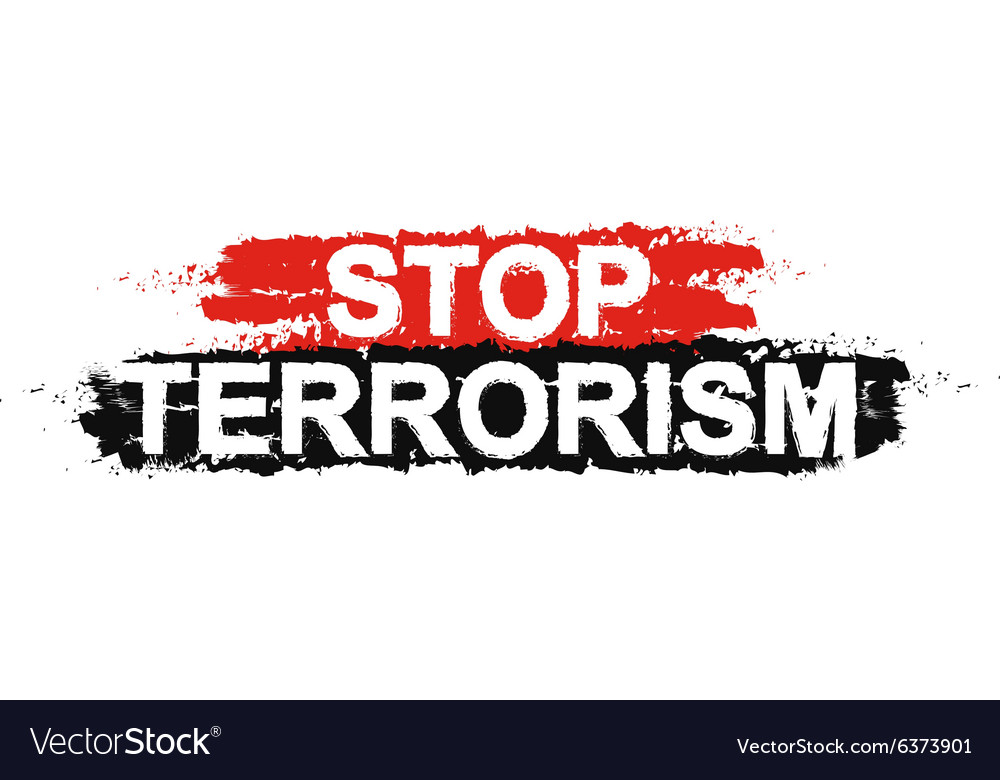